In [1]:
### Load Video

from torchvision.io.video import read_video
import math

num_samples = 6
video, audio, meta = read_video("swim02.mp4", output_format="TCHW")
sample_rate = math.floor(len(video)/6)

print(meta, sample_rate)

/anaconda3/lib/python3.7/site-packages/torchvision/io/video.py:162: UserWarning: The pts_unit 'pts' gives wrong results. Please use pts_unit 'sec'.
  warnings.warn("The pts_unit 'pts' gives wrong results. Please use pts_unit 'sec'.")


{'video_fps': 29.8807380150839} 38


In [2]:
### Select Frames
import torch

frames = []

for i in range(num_samples):
    frames.append(video[i*sample_rate])
    
batch = torch.stack(frames)

In [3]:
### Write PLOT functions
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image

def PLOT(frames):
    nrows = math.ceil(num_samples/2)
    ncols = 2
    
    fig, axis = plt.subplots(nrows=nrows, ncols=ncols, squeeze=False)
    fig.set_figheight(100)
    fig.set_figwidth(100)
    
    for idx, frame in enumerate(frames):
        row = math.floor(idx/2)
        col = idx%2
        cell = axis[row, col]
        pil_image = to_pil_image(frame)
        cell.imshow(pil_image)
        

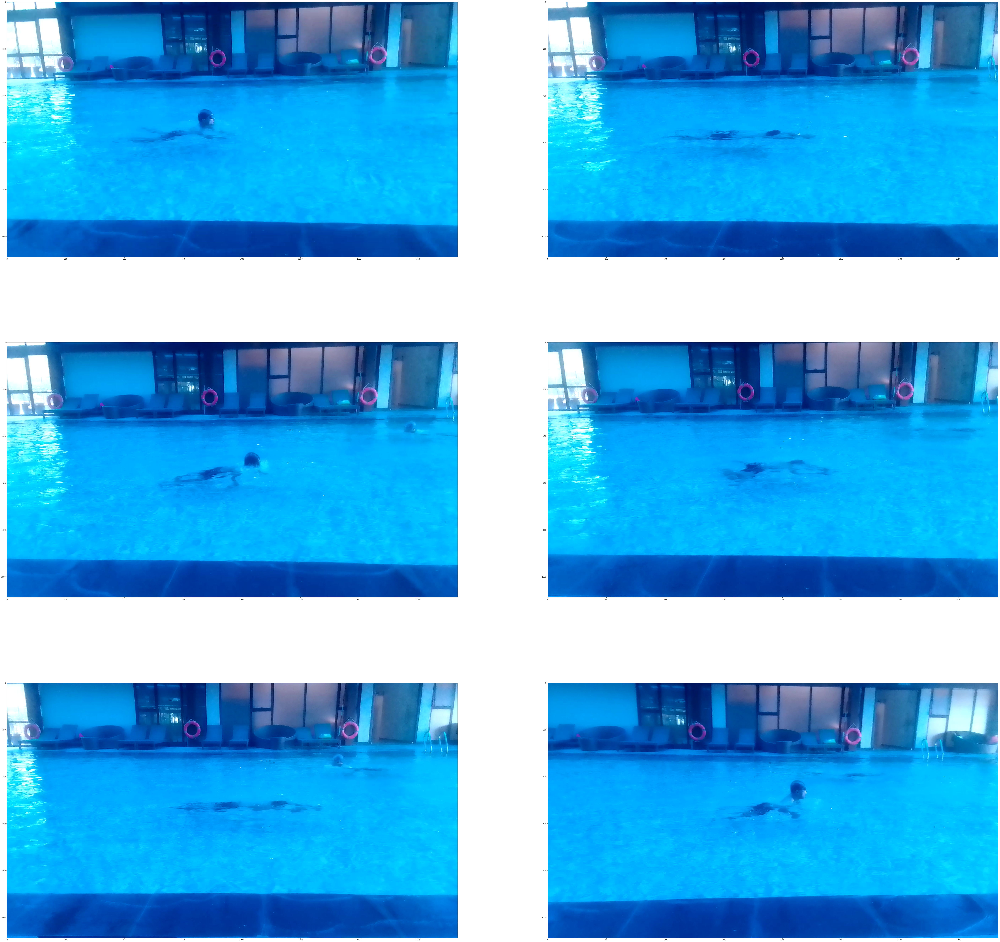

In [4]:
PLOT(batch)